# Surprise maps: Online purchases

In this section we analyze 

## Import libraries

In [47]:
import os
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import scipy
from scipy.integrate import quad
import pandas as pd
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable

## Load data

#### Population

In [2]:
# Population of each region
population_df = pd.read_csv('data/regions_population.csv')
population_df.drop(['TIPO_DATO15', 'Demographic data type', 'SEXISTAT1', 'Gender', 'ETA1', 'STATCIV2', 'Marital status', 'Select time', 'Flag Codes', 'Flags'], axis=1, inplace=True)

# Keep only the regions
population_df = population_df[population_df.ITTER107.apply(lambda x: len(x)==4)]

# Remove special provinces
population_df = population_df[~population_df.ITTER107.isin(['ITD1','ITD2'])]


# Group by year and region, summing the population in the different age range
population_df = population_df.groupby(['TIME', 'Territory']).sum()
population_df.reset_index(inplace=True)

#### GDP per capita (2012-2018)

In [3]:
gdp = pd.read_csv('data/regions_gdp.csv', encoding = "ISO-8859-1")

# Remove space in Value
gdp['Value'] = gdp['Value'].apply(lambda x: x.replace(' ', ''))
gdp['Value'] = pd.to_numeric(gdp['Value'])

# Merge Bolzano and Trento
for year in gdp['TIME'].unique():
    bolzano = gdp.loc[(gdp['GEO'] == 'Provincia Autonoma di Bolzano/Bozen') & (gdp['TIME'] == year)]['Value']
    trento = gdp.loc[(gdp['GEO'] == 'Provincia Autonoma di Trento') & (gdp['TIME'] == year)]['Value']
    sum_trento_bolzano = bolzano.item() + trento.item()
    gdp.loc[(gdp['GEO'] == 'Provincia Autonoma di Trento') & (gdp['TIME'] == year), 'Value'] = sum_trento_bolzano
    gdp.loc[(gdp['GEO'] == 'Provincia Autonoma di Trento') & (gdp['TIME'] == year), 'GEO'] = 'Trentino Alto Adige / Südtirol'
    gdp = gdp.loc[~((gdp['GEO'] == 'Provincia Autonoma di Bolzano/Bozen') & (gdp['TIME'] == year)),:]

gdp.loc[(gdp['GEO'] == 'Valle d\'Aosta/Vallée d\'Aoste'), 'GEO'] = 'Valle d\'Aosta / Vallée d\'Aoste'

# Compute the GDP per capita
# Remove data of 2010-2011 since we do not have the population data for those years
gdp = gdp.loc[~(gdp['TIME'] == 2010),:]
gdp = gdp.loc[~(gdp['TIME'] == 2011),:]

for year in gdp['TIME'].unique():
    for region in gdp['GEO'].unique():
        pop_value = population_df.loc[(population_df['TIME'] == year) & (population_df['Territory'] == region)]['Value'].item()
        current_gdp = gdp.loc[(gdp['TIME'] == year) & (gdp['GEO'] == region)]['Value'].item()
        gdp.loc[(gdp['TIME'] == year) & (gdp['GEO'] == region), 'Value'] = (current_gdp * 1000000) / pop_value

# The unit of measure is now "euro"
gdp['UNIT'] = gdp['UNIT'].apply(lambda x: x.replace('Million euro', 'euro'))

gdp.rename(columns={"GEO": 'Territory'}, inplace=True)

#### Internet usage (2012-2018)

In [4]:
int_access = pd.read_csv('data/internet_access_2012_2019.csv')

# Keep only the regions
int_access = int_access[int_access.ITTER107.apply(lambda x: len(x)==4)]

# Remove special provinces
int_access = int_access[~int_access.ITTER107.isin(['ITD1','ITD2'])]

# Remove 2019
int_access = int_access[~int_access.TIME.isin(['2019'])]

# Clean up
int_access.drop(['ITTER107', 'Data type', 'TIPO_DATO_SDS_ICT', 'Select time', 'Flag Codes', 'Flags'], axis=1, inplace=True)

#### Online purchases (2012-2018)

In [5]:
df = pd.read_csv('data/online_purchase_by_region_2012_2019.csv')
#df.drop(['TIPO_DATO_SDS_ICT', 'Select time', 'Flag Codes', 'Flags'], axis=1, inplace=True) #ITTER107,

# Keep only the regions
df = df[df.ITTER107.apply(lambda x: len(x)==4)]

# Remove special provinces
df = df[~df.ITTER107.isin(['ITD1','ITD2'])]

# Remove 2019 (no GDP data)
df = df[~df.TIME.isin(['2019'])]

online_purchases_df = df
online_purchases_df.head()

,ITTER107,Territory,TIPO_DATO_SDS_ICT,Data type,TIME,Select time,Value,Flag Codes,Flags
64,ITC1,Piemonte,COMM_3,within the last 3 months,2012,2012,20.5,NaN,NaN
65,ITC1,Piemonte,COMM_3,within the last 3 months,2013,2013,21.0,NaN,NaN
66,ITC1,Piemonte,COMM_3,within the last 3 months,2014,2014,26.9,NaN,NaN
67,ITC1,Piemonte,COMM_3,within the last 3 months,2015,2015,29.3,NaN,NaN
68,ITC1,Piemonte,COMM_3,within the last 3 months,2016,2016,31.9,NaN,NaN


In [6]:
def online_purch_clean(purch_df, type):
    df = purch_df[purch_df.TIPO_DATO_SDS_ICT==type]
    df = df[['TIME', 'Territory', 'Value']] #'Data type', 
    df = df.sort_values('Value', ascending = False)
    df.reset_index(drop=True, inplace=True)
    return df

# Split frequencies in different datasets
on_purch_3_df = online_purch_clean(online_purchases_df, 'COMM_3')
on_purch_3_12_df = online_purch_clean(online_purchases_df, 'COMM_3_12')
on_purch_12_more_df = online_purch_clean(online_purchases_df, 'COMM_12_MORE')
on_purch_never_df = online_purch_clean(online_purchases_df, 'COMM_NEVER')

In [7]:
on_purch_3_df = on_purch_3_df.set_index(['TIME', 'Territory'])
on_purch_3_12_df = on_purch_3_12_df.set_index(['TIME', 'Territory'])

# Percentage of people having made at least one online purchase ever, by region, by year
# It's needed for the surprise map, otherwise the prior and posterior would be inversely related
on_purch_never_inv = on_purch_never_df.copy()
on_purch_never_inv['Value'] = 100 - on_purch_never_inv['Value']

# Percentage of people having made at least one online purchase in the past year, by region, by year
on_purch_past_year = on_purch_3_df + on_purch_3_12_df

on_purch_3_df.reset_index(inplace=True)

on_purch_past_year.reset_index(inplace=True)

#### Education (2012-2018)

In [8]:
education_df = pd.read_csv('data/education_by_region_2012_2019.csv')

# Keep only the regions
education_df = education_df[education_df.ITTER107.apply(lambda x: len(x)==4)]

# Remove special provinces
education_df = education_df[~education_df.ITTER107.isin(['ITD1','ITD2'])]

# Remove 2019
education_df = education_df[~education_df.TIME.isin(['2019'])]

# No subdivision by gender
education_df = education_df[education_df.SEXISTAT1 == 9]

# Keep 15 years and older
education_df = education_df[education_df.ETA1.isin(['Y_GE15'])]

# Keep secondary school certificate and higher, total
# 6 -> post secondary school certificate
# 11 -> tertiary (university, doctoral and specialization courses)
# 99 -> total
education_df = education_df[education_df.TITOLO_STUDIO >= 6]

# Clean up
education_df = education_df[['Territory', 'TITOLO_STUDIO', 'Highest level of education attained', 'TIME', 'Value']]

In [9]:
education_pivot = education_df.pivot_table(index=['TIME','Territory'], columns='Highest level of education attained', values='Value')
education_pivot.rename(columns={"post secondary school certificate": "post secondary", "tertiary (university, doctoral and specialization courses)": "tertiary"}, inplace=True)
education_pivot['percentage'] = (education_pivot['post secondary']+education_pivot['tertiary'])/education_pivot['total']
education_pivot.reset_index(inplace=True)
education_perc = education_pivot.rename(columns={"percentage": "Value"})

## Plot the "default" graphs

In [10]:
map_reg = gpd.read_file(os.path.join('..', 'assets', 'maps', 'Reg01012019_g', 'Reg01012019_g_WGS84.shp'))
map_reg['DEN_REG'] = map_reg['DEN_REG'].replace({'Friuli Venezia Giulia': 'Friuli-Venezia Giulia', 'Trentino-Alto Adige': 'Trentino Alto Adige / Südtirol', "Valle d'Aosta": "Valle d'Aosta / Vallée d'Aoste"})

In [11]:
#Keep last available year (2018)
on_purch_past_year_2018 = on_purch_past_year[on_purch_past_year['TIME'] == 2018]
on_purch_3_2018 = on_purch_3_df[on_purch_3_df['TIME'] == 2018]
on_purch_never_2018 = on_purch_never_df[on_purch_never_df['TIME'] == 2018]

on_purch_past_year_2018_map = pd.merge(map_reg, on_purch_past_year_2018, left_on='DEN_REG', right_on='Territory', how='left')
on_purch_3_2018_map = pd.merge(map_reg, on_purch_3_2018, left_on='DEN_REG', right_on='Territory', how='left')
on_purch_never_2018_map = pd.merge(map_reg, on_purch_never_2018, left_on='DEN_REG', right_on='Territory', how='left')

In [12]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

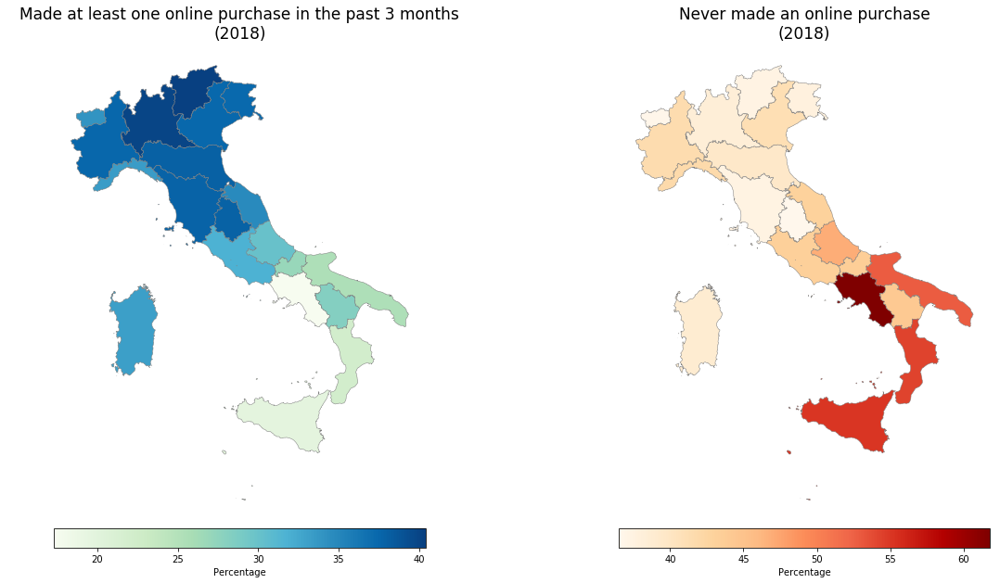

In [53]:
fig, ax = plt.subplots(ncols=2, figsize=(20, 10))

ax[0].axis('off')
divider1 = make_axes_locatable(ax[0])
cax1 = divider1.append_axes("bottom", size="4%", pad=0.1)
ax[0].set_title('Made at least one online purchase in the past 3 months\n(2018)', fontsize=17)
on_purch_3_2018_map.plot(column='Value', cmap='GnBu', linewidth=0.5, ax=ax[0], edgecolor='0.5', legend=True, legend_kwds={'label': "Percentage",
                             'orientation': "horizontal"}, cax=cax1) #vmin=0, vmax=max(on_purch_3_map['Value']), 


ax[1].axis('off')
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("bottom", size="4%", pad=0.1)
ax[1].set_title('Never made an online purchase\n(2018)', fontsize=17)
on_purch_never_2018_map.plot(column='Value', cmap='OrRd', linewidth=0.5, ax=ax[1], edgecolor='0.5', legend=True, legend_kwds={'label': "Percentage",
                             'orientation': "horizontal"}, cax=cax2) #vmin=0, vmax=max(on_purch_never_map['Value']), 


fig.show()

## Compute the surprise data

In [15]:

def compute_surprise_data(df):
    surprise_data=[]
    for index, region in enumerate(df['Territory'].unique()):
        surprise_data.append([])
        for _ in range(len(df['TIME'].unique())): 
            surprise_data[index].append(0)
    return surprise_data

Start with equiprobably P(M)s

For each year:

- Calculate observed-expected
- Estimate P(D|M)
- Estimate P(M|D)
- Surprise is D_KL ( P(M|D) || P(M) )
- Normalize so sum P(M)s = 1

For now, let's use only one model. We have to include inside our prior the economic status of the regions: an idea could be to take the GDP of each region and assume that the higher the GDP the higher the interaction with the public authorities. More precisely, we can assume that the highest GDP will correspond to the highest rate of interaction, and so on...

In [16]:
def surprise_algorithm(df, prior_df):
    
    pM = 1
    
    surprise_data = compute_surprise_data(df)

    for k, year in enumerate(df['TIME'].unique()):
        # Compute the average rate of the current year
        avg_rate = np.mean(df.loc[(df['TIME'] == year)]['Value'])
        # Compute the sum of the rates of the current year
        sum_rate = np.sum(df.loc[(df['TIME'] == year)]['Value'])

        # Get the list of regions ordered by GDP of the current year
        current_prior = prior_df.loc[prior_df['TIME'] == year].sort_values(by=['Value'], ascending=False)

        for j, region in enumerate(df['Territory'].unique()):
            # Estimate P(D|M) as 1 - |O - E|
            O = (df.loc[(df['TIME'] == year) & (df['Territory'] == region)]['Value'] / sum_rate).item()
            # Get the region with the highest GDP in the current year
            highest_prior = prior_df.loc[prior_df['TIME'] == year].max()['Territory']
            # Get the index of the current region in the ordered GDP list
            index = list(current_prior['Territory']).index(region)
            # Get the current data observed and sort them
            obs_data = df.loc[(df['TIME'] == year)]
            obs_data.sort_values(by=['Value'], ascending=False, inplace=True)
            # Get the expected value
            E = (obs_data.iloc[index]['Value'] / sum_rate).item()

            # P(D|M)
            pDM = 1 - np.abs(O - E)

            # Estimate P(M|D)
            pMD = pDM * pM

            # Surprise is the sum of KL divergance across model space (only one here)
            kl = pMD * (np.log(pMD / pM) / np.log(2))
            surprise_data[j][k] = np.abs(kl) if (O - E) > 0 else -np.abs(kl)

        # Now let's globally update our model belief
        if k % 2 == 0:
            pDM = 1 - (0.5 * np.abs(O - E))
            pMD = pDM * pM
            pM = pMD

    return surprise_data

In [17]:
def surprise_dataframe(df, prior_df):
    df_structure = {}

    for region in df['Territory'].unique():
        df_structure[region] = []

    for index, region in enumerate(df_structure):
        df_structure[region] = surprise_algorithm(df, prior_df)[index]

    surprise_df = pd.DataFrame(df_structure).transpose()
    surprise_df.index.name = 'Territory'
    surprise_df.columns = [str(year) for year in df['TIME'].unique()]

    return surprise_df

## Plot the surprise maps

### GDP

In [18]:
gdp_surprise_df_1 = surprise_dataframe(on_purch_3_df, gdp)
gdp_surprise_df_2 = surprise_dataframe(on_purch_never_inv, gdp)

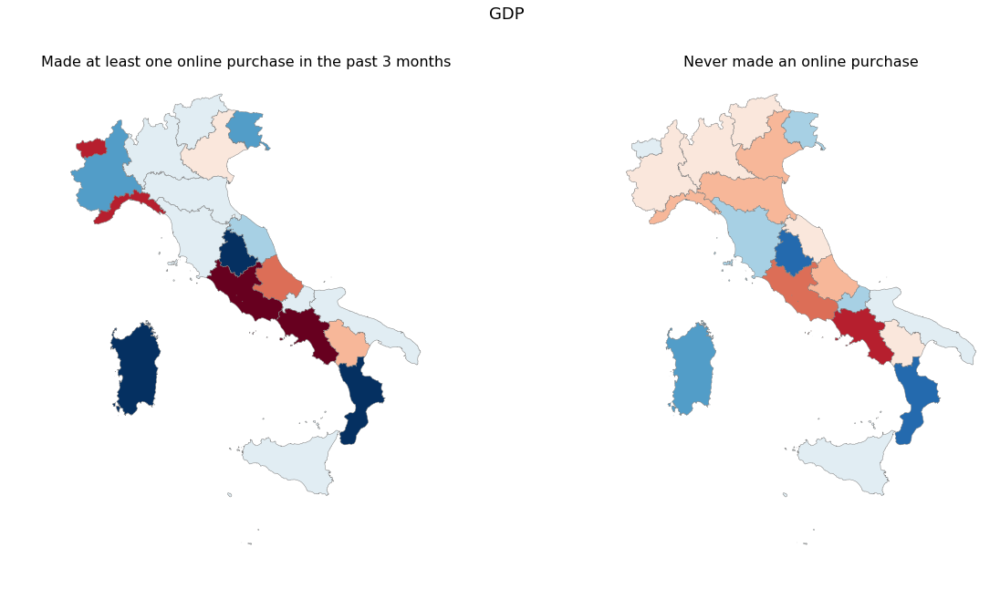

In [30]:
map_reg = gpd.read_file(os.path.join('..', 'assets', 'maps', 'Reg01012019_g', 'Reg01012019_g_WGS84.shp'))
map_reg['DEN_REG'] = map_reg['DEN_REG'].replace({'Friuli Venezia Giulia': 'Friuli-Venezia Giulia', 'Trentino-Alto Adige': 'Trentino Alto Adige / Südtirol', "Valle d'Aosta": "Valle d'Aosta / Vallée d'Aoste"})

# Merge the map with the pandas dfs
merged_1 = pd.merge(map_reg, gdp_surprise_df_1, left_on='DEN_REG', right_on='Territory', how='left')
merged_2 = pd.merge(map_reg, gdp_surprise_df_2, left_on='DEN_REG', right_on='Territory', how='left')

YEAR = '2018'
cmap = discrete_cmap(10, 'RdBu')
max_abs_value_1 = max(np.abs(min(merged_1[YEAR])), np.abs(max(merged_1[YEAR])))
max_abs_value_2 = max(np.abs(min(merged_2[YEAR])), np.abs(max(merged_2[YEAR])))
max_value = max(max_abs_value_1, max_abs_value_2)


fig, ax = plt.subplots(ncols=2, figsize=(20, 10))

plt.suptitle('GDP',fontsize=18)

ax[0].axis('off')
ax[0].set_title('Made at least one online purchase in the past 3 months', fontsize=16)
merged_1.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[0], edgecolor='0.5')

ax[1].axis('off')
ax[1].set_title('Never made an online purchase', fontsize=16)
merged_2.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[1], edgecolor='0.5')


# Common colorbar
norm = colors.Normalize(vmin=-max_value, vmax=max_value)
#cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation="horizontal", fraction=0.06, pad=0.01)
#cbar.set_label('Signed Surprise', fontsize=16)

fig.show()

### Internet usage

In [34]:
int_surprise_df_1 = surprise_dataframe(on_purch_3_df, int_access)
int_surprise_df_2 = surprise_dataframe(on_purch_never_inv, int_access)

KeyboardInterrupt: 

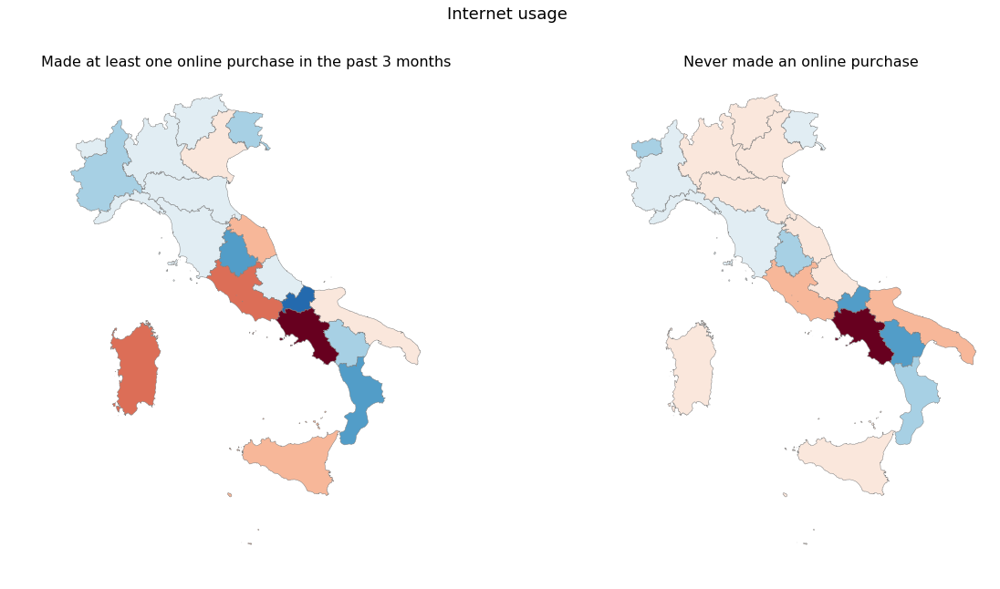

In [36]:
map_reg = gpd.read_file(os.path.join('..', 'assets', 'maps', 'Reg01012019_g', 'Reg01012019_g_WGS84.shp'))
map_reg['DEN_REG'] = map_reg['DEN_REG'].replace({'Friuli Venezia Giulia': 'Friuli-Venezia Giulia', 'Trentino-Alto Adige': 'Trentino Alto Adige / Südtirol', "Valle d'Aosta": "Valle d'Aosta / Vallée d'Aoste"})

# Merge the map with the pandas dfs
merged_1 = pd.merge(map_reg, int_surprise_df_1, left_on='DEN_REG', right_on='Territory', how='left')
merged_2 = pd.merge(map_reg, int_surprise_df_2, left_on='DEN_REG', right_on='Territory', how='left')

YEAR = '2018'
cmap = discrete_cmap(10, 'RdBu')
max_abs_value_1 = max(np.abs(min(merged_1[YEAR])), np.abs(max(merged_1[YEAR])))
max_abs_value_2 = max(np.abs(min(merged_2[YEAR])), np.abs(max(merged_2[YEAR])))
max_value = max(max_abs_value_1, max_abs_value_2)


fig, ax = plt.subplots(ncols=2, figsize=(20, 10))

plt.suptitle('Internet usage',fontsize=18)

ax[0].axis('off')
ax[0].set_title('Made at least one online purchase in the past 3 months', fontsize=16)
merged_1.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[0], edgecolor='0.5')

ax[1].axis('off')
ax[1].set_title('Never made an online purchase', fontsize=16)
merged_2.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[1], edgecolor='0.5')


# Common colorbar
norm = colors.Normalize(vmin=-max_value, vmax=max_value)
#cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation="horizontal", fraction=0.06, pad=0.01)
#cbar.set_label('Signed Surprise', fontsize=16)

fig.show()

In [37]:
merged_1

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry,2018,2017,2016,2015,2014,2013,2012
0,1,1,Piemonte,1.236787e+06,2.539389e+10,"POLYGON ((457749.4639999997 5145501.795399999,...",0.008042,0.007060,0.009095,0.002994,0.007907,-0.000000,0.008340
1,1,2,Valle d'Aosta / Vallée d'Aoste,3.109681e+05,3.258838e+09,"POLYGON ((390652.6441000002 5091766.1713, 3907...",0.001791,0.027797,0.019931,0.021895,0.004263,0.023945,0.022253
2,1,3,Lombardia,1.410223e+06,2.386232e+10,"(POLYGON ((595652.3584000003 5163515.6587, 596...",-0.000000,-0.004240,-0.006762,-0.000000,-0.006086,-0.008348,-0.005692
3,2,4,Trentino Alto Adige / Südtirol,8.008937e+05,1.360755e+10,"POLYGON ((743267.7493000003 5219765.793199999,...",-0.000000,-0.005181,0.010648,-0.015175,-0.000000,-0.000000,-0.024496
4,2,5,Veneto,1.054698e+06,1.834353e+10,"POLYGON ((768123.96 5175397.4969, 768135.20990...",-0.000672,0.001415,-0.000000,-0.002994,-0.003046,-0.011546,-0.000000
5,1,7,Liguria,8.196404e+05,5.414545e+09,"(POLYGON ((459010.2304999996 4906246.5812, 458...",-0.000000,-0.009640,0.006762,0.015713,0.005782,0.025843,0.016630
6,2,6,Friuli-Venezia Giulia,6.716581e+05,7.934013e+09,"(POLYGON ((852603.4839000003 5080093.1843, 852...",0.005813,0.022932,-0.011683,0.001906,0.006086,0.012185,0.010606
7,4,16,Puglia,1.178211e+06,1.953564e+10,"(POLYGON ((1258535.8653 4539852.825200001, 125...",-0.003356,-0.000000,0.005204,-0.000000,-0.000610,-0.004180,-0.001520
8,2,8,Emilia-Romagna,1.175739e+06,2.244260e+10,(POLYGON ((572180.3065999998 4994427.402000001...,-0.000000,0.002357,-0.001563,-0.004624,-0.003655,0.007388,0.004176
9,3,9,Toscana,1.305938e+06,2.298395e+10,(POLYGON ((675840.8899999997 4700255.199999999...,0.000448,0.003770,-0.001042,0.007608,0.001524,0.001931,-0.006070


### Education

In [22]:
edu_surprise_df_1 = surprise_dataframe(on_purch_3_df, education_perc)
edu_surprise_df_2 = surprise_dataframe(on_purch_never_inv, education_perc)

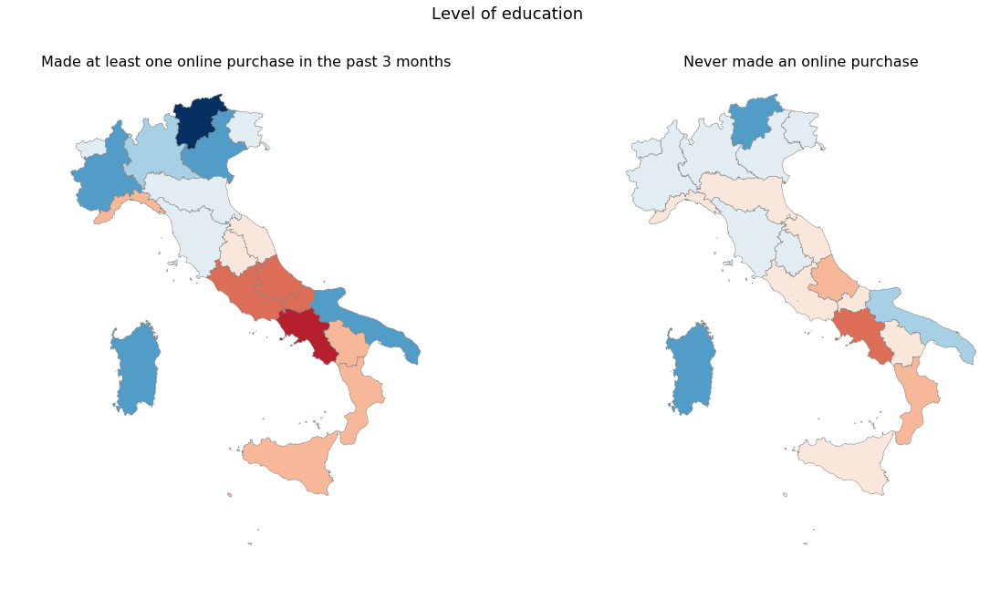

In [32]:
map_reg = gpd.read_file(os.path.join('..', 'assets', 'maps', 'Reg01012019_g', 'Reg01012019_g_WGS84.shp'))
map_reg['DEN_REG'] = map_reg['DEN_REG'].replace({'Friuli Venezia Giulia': 'Friuli-Venezia Giulia', 'Trentino-Alto Adige': 'Trentino Alto Adige / Südtirol', "Valle d'Aosta": "Valle d'Aosta / Vallée d'Aoste"})

# Merge the map with the pandas dfs
merged_1 = pd.merge(map_reg, edu_surprise_df_1, left_on='DEN_REG', right_on='Territory', how='left')
merged_2 = pd.merge(map_reg, edu_surprise_df_2, left_on='DEN_REG', right_on='Territory', how='left')

YEAR = '2018'
cmap = discrete_cmap(10, 'RdBu')
max_abs_value_1 = max(np.abs(min(merged_1[YEAR])), np.abs(max(merged_1[YEAR])))
max_abs_value_2 = max(np.abs(min(merged_2[YEAR])), np.abs(max(merged_2[YEAR])))
max_value = max(max_abs_value_1, max_abs_value_2)

fig, ax = plt.subplots(ncols=2, figsize=(20, 10))

plt.suptitle('Level of education',fontsize=18)

ax[0].axis('off')
ax[0].set_title('Made at least one online purchase in the past 3 months', fontsize=16)
merged_1.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[0], edgecolor='0.5')

ax[1].axis('off')
ax[1].set_title('Never made an online purchase', fontsize=16)
merged_2.plot(column=YEAR, vmin=-max_value, vmax=max_value, cmap=cmap, linewidth=0.5, ax=ax[1], edgecolor='0.5')


# Common colorbar
norm = colors.Normalize(vmin=-max_value, vmax=max_value)
#cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation="horizontal", fraction=0.06, pad=0.01)
#cbar.set_label('Signed Surprise', fontsize=16)

fig.show()